Pertama, import library yang dibutuhkan

In [1]:
# Library yang dibutuhkan

import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
import glob
import time
import cv2
import os 

%matplotlib inline

In [2]:
# Panggil Dataset (Data Latih)
# Urutan Data Gambar Pemandangan
# bangunan
# gunung
# hutan
# laut
# jalan


dir_bangunan = "Dataset1/training-data/bangunan/*.jpg"
dir_gunung = "Dataset1/training-data/gunung/*.jpg"
dir_hutan = "Dataset1/training-data/hutan/*.jpg"
dir_laut = "Dataset1/training-data/laut/*.jpg"
dir_jalan = "Dataset1/training-data/jalan/*.jpg"

files = glob.glob(dir_bangunan) 
bangunan = []
for f1 in files: 
    img = cv2.imread(f1) 
    bangunan.append(img) 

files = glob.glob(dir_gunung) 
gunung = []
for f1 in files: 
    img = cv2.imread(f1) 
    gunung.append(img) 

files = glob.glob(dir_hutan) 
hutan = []
for f1 in files: 
    img = cv2.imread(f1) 
    hutan.append(img) 

files = glob.glob(dir_laut) 
laut = []
for f1 in files: 
    img = cv2.imread(f1) 
    laut.append(img) 

files = glob.glob(dir_jalan) 
jalan = []
for f1 in files: 
    img = cv2.imread(f1) 
    jalan.append(img)
    
# Panggil Dataset (Data Uji)

dir_bangunan_uji = "Dataset1/testing-data/bangunan/*.jpg"
dir_gunung_uji = "Dataset1/testing-data/gunung/*.jpg"
dir_hutan_uji = "Dataset1/testing-data/hutan/*.jpg"
dir_laut_uji = "Dataset1/testing-data/laut/*.jpg"
dir_jalan_uji = "Dataset1/testing-data/jalan/*.jpg"

files = glob.glob(dir_bangunan_uji) 
bangunan_uji = []
for f1 in files: 
    img = cv2.imread(f1) 
    bangunan_uji.append(img) 

files = glob.glob(dir_gunung_uji) 
gunung_uji = []
for f1 in files: 
    img = cv2.imread(f1) 
    gunung_uji.append(img) 

files = glob.glob(dir_hutan_uji) 
hutan_uji = []
for f1 in files: 
    img = cv2.imread(f1) 
    hutan_uji.append(img) 

files = glob.glob(dir_laut_uji) 
laut_uji = []
for f1 in files: 
    img = cv2.imread(f1) 
    laut_uji.append(img) 

files = glob.glob(dir_jalan_uji) 
jalan_uji = []
for f1 in files: 
    img = cv2.imread(f1) 
    jalan_uji.append(img)


In [3]:
# Cek ukuran Data latih
[np.shape(bangunan), np.shape(gunung), np.shape(hutan), np.shape(laut), np.shape(jalan)]

[(40, 150, 150, 3),
 (40, 150, 150, 3),
 (40, 150, 150, 3),
 (40, 150, 150, 3),
 (40, 150, 150, 3)]

In [4]:
# Cek ukuran Data Uji
[np.shape(bangunan_uji), np.shape(gunung_uji), np.shape(hutan_uji), np.shape(laut_uji), np.shape(jalan_uji)]

[(10, 150, 150, 3),
 (10, 150, 150, 3),
 (10, 150, 150, 3),
 (10, 150, 150, 3),
 (10, 150, 150, 3)]

In [5]:
# Data Latih semua jenis ikan digabung
X = np.vstack((bangunan, gunung, hutan, laut, jalan)).astype(np.float32)                        

In [6]:
# Cek ukuran Data Latih setelah digabung
X.shape

(200, 150, 150, 3)

In [7]:
# Tampilkan sebelum dinormalisasi
print(X)

[[[[ 43.  88.  91.]
   [ 47.  83.  83.]
   [  2.  21.  18.]
   ...
   [158.  84.  28.]
   [158.  84.  28.]
   [158.  84.  28.]]

  [[ 18.  49.  48.]
   [ 69.  93.  91.]
   [105. 119. 117.]
   ...
   [158.  84.  28.]
   [158.  84.  28.]
   [158.  84.  28.]]

  [[ 92.  95.  86.]
   [101. 105.  99.]
   [105. 112. 109.]
   ...
   [159.  85.  29.]
   [159.  85.  29.]
   [159.  85.  29.]]

  ...

  [[ 33.  28.  29.]
   [ 37.  31.  32.]
   [ 31.  23.  23.]
   ...
   [167. 184. 187.]
   [152. 167. 169.]
   [159. 172. 174.]]

  [[ 37.  32.  33.]
   [ 41.  35.  36.]
   [ 24.  16.  16.]
   ...
   [186. 203. 206.]
   [165. 180. 183.]
   [172. 184. 188.]]

  [[ 21.  16.  17.]
   [ 30.  25.  26.]
   [ 21.  13.  13.]
   ...
   [199. 216. 219.]
   [173. 188. 191.]
   [179. 191. 195.]]]


 [[[170. 120.  68.]
   [170. 120.  68.]
   [170. 120.  68.]
   ...
   [188. 140.  82.]
   [189. 141.  83.]
   [189. 141.  83.]]

  [[170. 120.  68.]
   [170. 120.  68.]
   [170. 120.  68.]
   ...
   [188. 140.  82.]
 

In [8]:
# Data Latih semua jenis gambar pemandangan Dinormalisasi

X = X / 255.0

In [9]:
X.shape

(200, 150, 150, 3)

In [10]:
len(bangunan)

40

In [11]:
# Tampilkan setelah dinormalisasi
print(X)

[[[[0.16862746 0.34509805 0.35686275]
   [0.18431373 0.3254902  0.3254902 ]
   [0.00784314 0.08235294 0.07058824]
   ...
   [0.61960787 0.32941177 0.10980392]
   [0.61960787 0.32941177 0.10980392]
   [0.61960787 0.32941177 0.10980392]]

  [[0.07058824 0.19215687 0.1882353 ]
   [0.27058825 0.3647059  0.35686275]
   [0.4117647  0.46666667 0.45882353]
   ...
   [0.61960787 0.32941177 0.10980392]
   [0.61960787 0.32941177 0.10980392]
   [0.61960787 0.32941177 0.10980392]]

  [[0.36078432 0.37254903 0.3372549 ]
   [0.39607844 0.4117647  0.3882353 ]
   [0.4117647  0.4392157  0.42745098]
   ...
   [0.62352943 0.33333334 0.11372549]
   [0.62352943 0.33333334 0.11372549]
   [0.62352943 0.33333334 0.11372549]]

  ...

  [[0.12941177 0.10980392 0.11372549]
   [0.14509805 0.12156863 0.1254902 ]
   [0.12156863 0.09019608 0.09019608]
   ...
   [0.654902   0.72156864 0.73333335]
   [0.59607846 0.654902   0.6627451 ]
   [0.62352943 0.6745098  0.68235296]]

  [[0.14509805 0.1254902  0.12941177]
   [0.1

In [12]:
# Data Uji semua jenis gambar pemandangan digabung
X_uji = np.vstack((bangunan_uji, gunung_uji, hutan_uji, laut_uji, jalan_uji)).astype(np.float32)                        


In [13]:
# Cek ukuran Data Uji
X_uji.shape

(50, 150, 150, 3)

In [14]:
# Data Uji sebelum dinormalisasi
print(X_uji)

[[[[174. 119.  92.]
   [189. 140. 114.]
   [166. 124. 101.]
   ...
   [207. 148. 109.]
   [208. 149. 110.]
   [208. 149. 110.]]

  [[160. 113.  86.]
   [227. 181. 157.]
   [204. 163. 141.]
   ...
   [205. 146. 106.]
   [206. 147. 107.]
   [206. 147. 107.]]

  [[186. 152. 128.]
   [195. 161. 138.]
   [213. 176. 156.]
   ...
   [205. 145. 103.]
   [205. 145. 103.]
   [205. 145. 103.]]

  ...

  [[224. 207. 198.]
   [224. 207. 198.]
   [223. 206. 197.]
   ...
   [242. 230. 224.]
   [243. 233. 226.]
   [245. 235. 228.]]

  [[224. 206. 195.]
   [224. 206. 195.]
   [224. 206. 195.]
   ...
   [242. 230. 224.]
   [245. 235. 228.]
   [249. 239. 232.]]

  [[222. 205. 192.]
   [222. 205. 192.]
   [223. 205. 194.]
   ...
   [241. 229. 223.]
   [247. 237. 230.]
   [251. 241. 234.]]]


 [[[247. 233. 227.]
   [247. 233. 227.]
   [247. 233. 227.]
   ...
   [234. 220. 214.]
   [232. 218. 212.]
   [233. 219. 213.]]

  [[241. 227. 221.]
   [241. 227. 221.]
   [242. 228. 222.]
   ...
   [239. 225. 219.]
 

In [15]:
# Data Uji semua jenis gambar pemandangan Dinormalisasi

X_uji = X_uji / 255.0


In [16]:
# Cek setelah dinormalisasi
print(X_uji)

[[[[0.68235296 0.46666667 0.36078432]
   [0.7411765  0.54901963 0.44705883]
   [0.6509804  0.4862745  0.39607844]
   ...
   [0.8117647  0.5803922  0.42745098]
   [0.8156863  0.58431375 0.43137255]
   [0.8156863  0.58431375 0.43137255]]

  [[0.627451   0.44313726 0.3372549 ]
   [0.8901961  0.70980394 0.6156863 ]
   [0.8        0.6392157  0.5529412 ]
   ...
   [0.8039216  0.57254905 0.41568628]
   [0.80784315 0.5764706  0.41960785]
   [0.80784315 0.5764706  0.41960785]]

  [[0.7294118  0.59607846 0.5019608 ]
   [0.7647059  0.6313726  0.5411765 ]
   [0.8352941  0.6901961  0.6117647 ]
   ...
   [0.8039216  0.5686275  0.40392157]
   [0.8039216  0.5686275  0.40392157]
   [0.8039216  0.5686275  0.40392157]]

  ...

  [[0.8784314  0.8117647  0.7764706 ]
   [0.8784314  0.8117647  0.7764706 ]
   [0.8745098  0.80784315 0.77254903]
   ...
   [0.9490196  0.9019608  0.8784314 ]
   [0.9529412  0.9137255  0.8862745 ]
   [0.9607843  0.92156863 0.89411765]]

  [[0.8784314  0.80784315 0.7647059 ]
   [0.8

In [17]:
# Label gambar pemandangan Data Latih
label_bangunan = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
label_gunung   = np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
label_hutan    = np.array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])
label_laut     = np.array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])
label_jalan    = np.array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [18]:
# Cek ukuran label Data Latih
[np.shape(label_bangunan), np.shape(label_gunung), np.shape(label_hutan), np.shape(label_laut), np.shape(label_jalan)]

[(40,), (40,), (40,), (40,), (40,)]

In [19]:
# Semua Label Gambar Pemandangan Data Latih digabung
y = np.hstack((label_bangunan, label_gunung, label_hutan, label_laut, label_jalan))

In [20]:
# Cek ukuran label Gambar Pemandangan Data Latih
y.shape

(200,)

In [21]:
# Label Gambar Pemandangan Data Uji
label_bangunan_uji = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
label_gunung_uji   = np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
label_hutan_uji    = np.array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2])
label_laut_uji     = np.array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3])
label_jalan_uji    = np.array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [22]:
# Cek ukuran label Data Uji
[np.shape(label_bangunan_uji), np.shape(label_gunung_uji), np.shape(label_hutan_uji), np.shape(label_laut_uji), np.shape(label_jalan_uji)]

[(10,), (10,), (10,), (10,), (10,)]

In [23]:
# Semua Label Gambar Pemandangan Data Uji digabung
y_uji = np.hstack((label_bangunan_uji, label_gunung_uji, label_hutan_uji, label_laut_uji, label_jalan_uji))

In [24]:
# Cek ukuran label Gambar Pemandangan Data Uji
y_uji.shape

(50,)

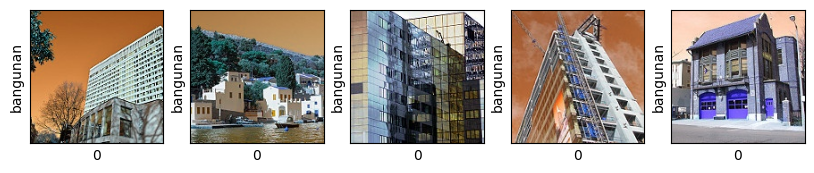

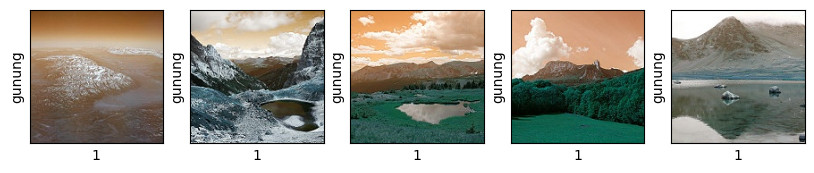

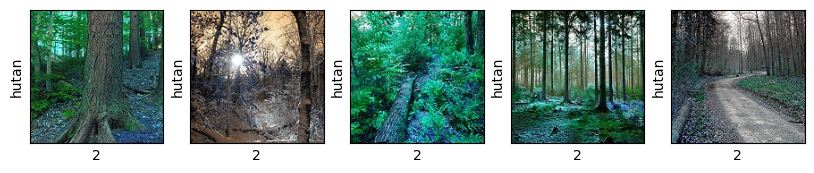

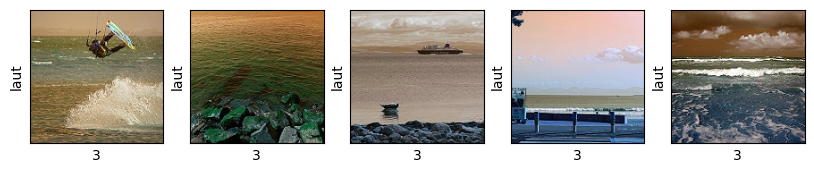

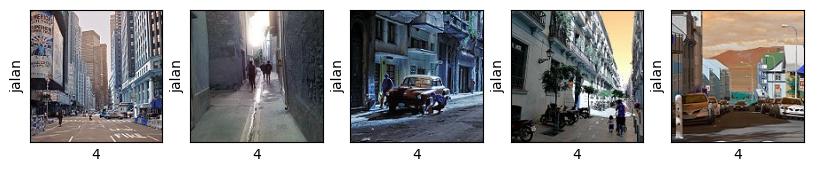

In [25]:
# Tampilkan sampel Data Latih

class_names = ['bangunan', 'gunung','hutan','laut','jalan']

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(bangunan[i], cmap=plt.cm.binary)
    plt.xlabel(label_bangunan[i])
    plt.ylabel(class_names[0])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(gunung[i], cmap=plt.cm.binary)
    plt.xlabel(label_gunung[i])
    plt.ylabel(class_names[1])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(3,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(hutan[i], cmap=plt.cm.binary)
    plt.xlabel(label_hutan[i])
    plt.ylabel(class_names[2])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(4,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(laut[i], cmap=plt.cm.binary)
    plt.xlabel(label_laut[i])
    plt.ylabel(class_names[3])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(jalan[i], cmap=plt.cm.binary)
    plt.xlabel(label_jalan[i])
    plt.ylabel(class_names[4])
plt.show()

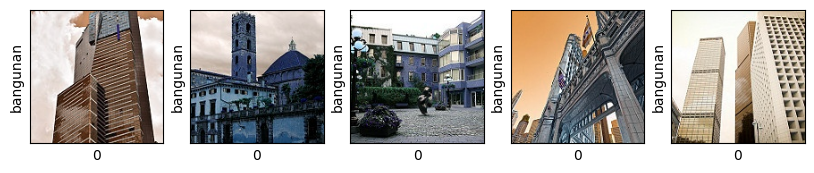

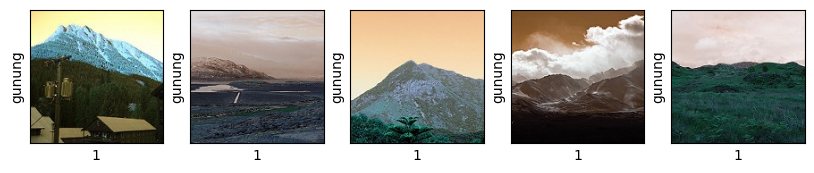

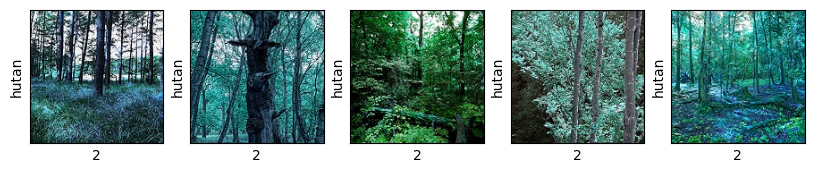

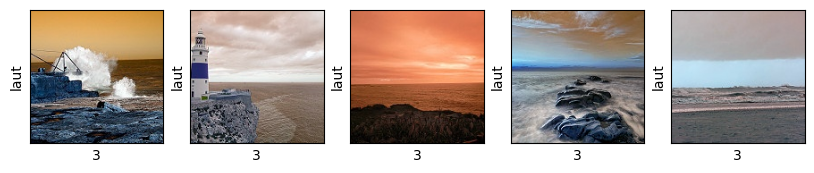

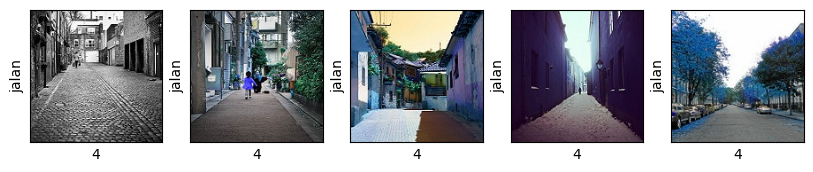

In [26]:
# Tampilkan sampel Data Uji

class_names = ['bangunan', 'gunung','hutan','laut','jalan']

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(bangunan_uji[i], cmap=plt.cm.binary)
    plt.xlabel(label_bangunan_uji[i])
    plt.ylabel(class_names[0])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(gunung_uji[i], cmap=plt.cm.binary)
    plt.xlabel(label_gunung_uji[i])
    plt.ylabel(class_names[1])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(3,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(hutan_uji[i], cmap=plt.cm.binary)
    plt.xlabel(label_hutan_uji[i])
    plt.ylabel(class_names[2])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(4,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(laut_uji[i], cmap=plt.cm.binary)
    plt.xlabel(label_laut_uji[i])
    plt.ylabel(class_names[3])
plt.show()

plt.figure(figsize=(10,10))
for i in range(5):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(jalan_uji[i], cmap=plt.cm.binary)
    plt.xlabel(label_jalan_uji[i])
    plt.ylabel(class_names[4])
plt.show()

Buat basis konvolusional 10 baris kode di bawah ini mendefinisikan dasar convolutional menggunakan pola umum: setumpuk Conv2D dan MaxPooling2D lapisan.

Sebagai masukan, CNN mengambil bentuk tensor (tinggi_gambar, lebar_gambar, saluran_warna), mengabaikan ukuran tumpukan. Color_channels merujuk ke (R, G, B). CNN untuk memproses masukan dalam bentuk (150, 150, 3), sesuai Data Latih yang digunakan. Dapat dilakukan dengan meneruskan argumen input_shape ke lapisan pertama kita.

In [27]:
model = models.Sequential()
model.add(layers.Conv2D(100, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(200, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(200, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(200, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(200, (3, 3), activation='relu'))

Mari kita tampilkan arsitektur model kita sejauh ini.

In [28]:
# Menampilkan arsitektur model CNN
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 100)     2800      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 100)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 200)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 200)       360200    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 200)      0

Di atas, dapat dilihat bahwa output dari setiap lapisan Conv2D dan MaxPooling2D adalah bentuk tensor 3D (tinggi, lebar, saluran). Dimensi lebar dan tinggi cenderung menyusut saat Anda masuk lebih dalam di jaringan. Biasanya, saat lebar dan tinggi menyusut, Anda dapat (secara komputasi) untuk menambahkan lebih banyak saluran keluaran di setiap lapisan Konv2D.

Tambahkan lapisan padat di atas untuk melengkapi model kita. Dapat dimasukkan tensor keluaran terakhir dari basis konvolusional (berbentuk (2, 2, 200)) ke dalam satu atau lebih lapisan Padat untuk melakukan klasifikasi. Lapisan padat mengambil vektor sebagai masukan (yaitu 1D), sedangkan keluaran saat ini adalah tensor 3D. Pertama, Anda akan meratakan (atau membuka gulungan) keluaran 3D ke 1D, lalu menambahkan satu atau lebih lapisan Padat di atasnya. Sitem memiliki 5 kelas keluaran, jadi digunakan lapisan Dense akhir dengan 5 keluaran.

In [29]:
model.add(layers.Flatten())
model.add(layers.Dense(200, activation='relu'))
model.add(layers.Dense(5))

Berikut arsitektur lengkap model kami.

In [30]:
# menampilkan arsitektur lengkap model CNN
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 100)     2800      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 100)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 200)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 200)       360200    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 200)      0

Seperti yang Anda lihat, keluaran (2, 2, 200) kita diratakan menjadi vektor bentuk (800) sebelum melewati dua layer Dense.

Kumpulkan dan latih modelnya

In [31]:
# Kumpulkan dan latih modelnya
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(X, y, epochs=20, 
                    validation_data=(X_uji, y_uji))

Epoch 1/20
7/7 [==============================] - 18s 2s/step - loss: 1.6437 - accuracy: 0.1900 - val_loss: 1.6042 - val_accuracy: 0.2000
Epoch 2/20
7/7 [==============================] - 20s 3s/step - loss: 1.6076 - accuracy: 0.2000 - val_loss: 1.6047 - val_accuracy: 0.2000
Epoch 3/20
7/7 [==============================] - 21s 3s/step - loss: 1.6002 - accuracy: 0.2000 - val_loss: 1.5682 - val_accuracy: 0.2000
Epoch 4/20
7/7 [==============================] - 17s 2s/step - loss: 1.5658 - accuracy: 0.2850 - val_loss: 1.4179 - val_accuracy: 0.4400
Epoch 5/20
7/7 [==============================] - 22s 3s/step - loss: 1.3831 - accuracy: 0.4100 - val_loss: 1.3781 - val_accuracy: 0.4000
Epoch 6/20
7/7 [==============================] - 20s 3s/step - loss: 1.3669 - accuracy: 0.4400 - val_loss: 1.2090 - val_accuracy: 0.6000
Epoch 7/20
7/7 [==============================] - 17s 2s/step - loss: 1.2945 - accuracy: 0.4250 - val_loss: 1.0951 - val_accuracy: 0.5200
Epoch 8/20
7/7 [==================

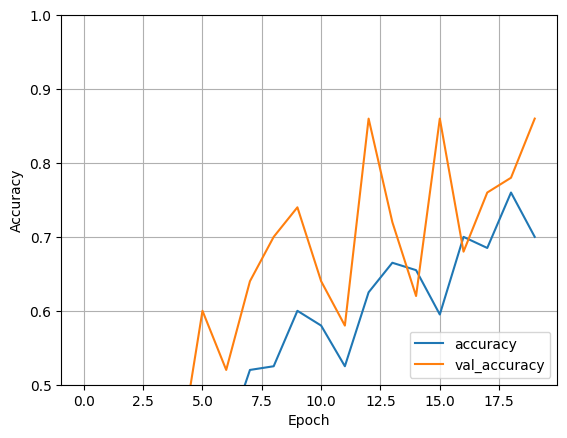

In [32]:
# Tampilkan grafik hasil pelatihan CNN dan validasi dengan Data Uji
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.grid()

In [33]:
# Evaluasi modelnya
test_loss, test_acc = model.evaluate(X_uji,  y_uji, verbose=2)
# Tampilkan hasil tes akurasi
print('Hasil akurasi pengujian =',test_acc)

2/2 - 1s - loss: 0.6782 - accuracy: 0.8600 - 844ms/epoch - 422ms/step
Hasil akurasi pengujian = 0.8600000143051147


2/2 [==============================] - 1s 324ms/step


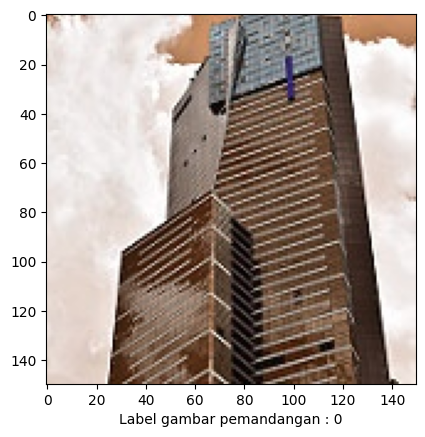

Hasil prediksi model: 0


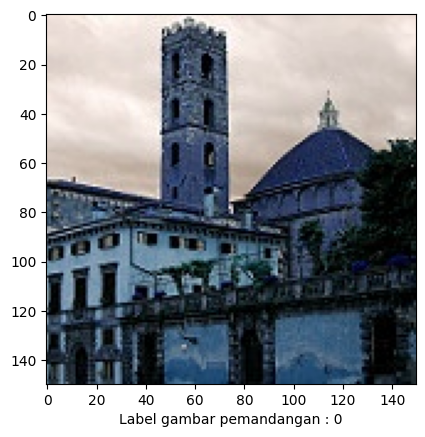

Hasil prediksi model: 0


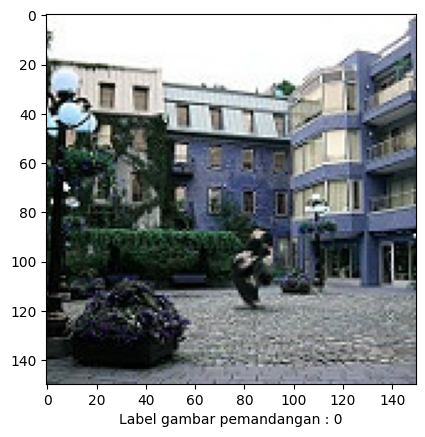

Hasil prediksi model: 1


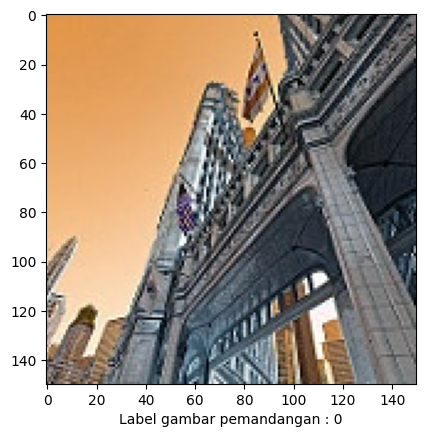

Hasil prediksi model: 0


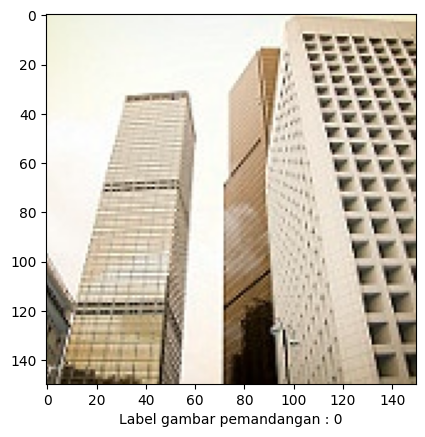

Hasil prediksi model: 3


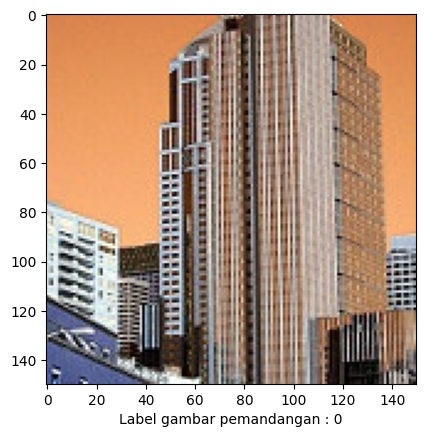

Hasil prediksi model: 0


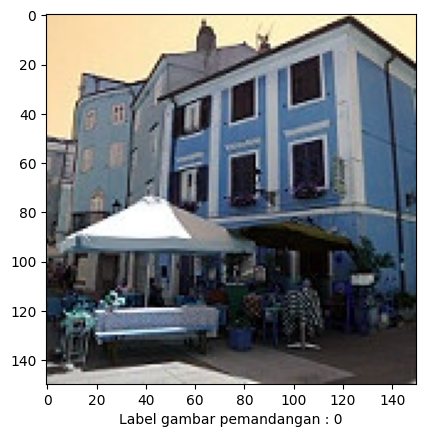

Hasil prediksi model: 0


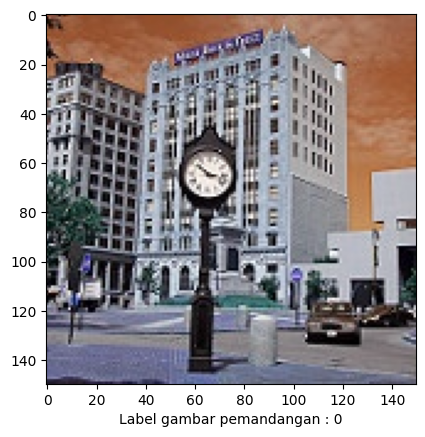

Hasil prediksi model: 0


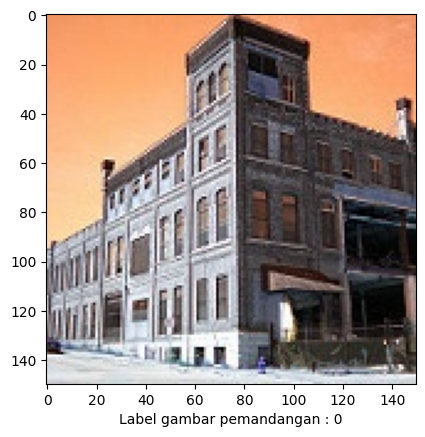

Hasil prediksi model: 0


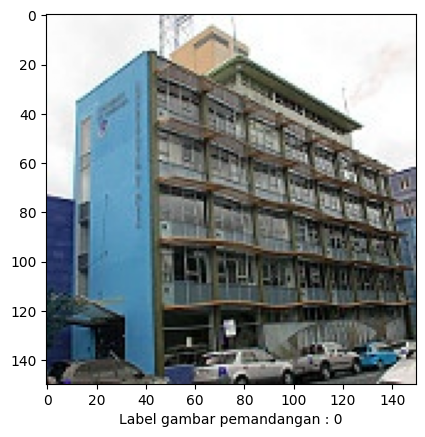

Hasil prediksi model: 0


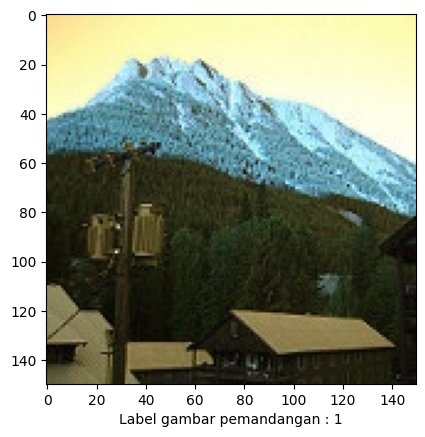

Hasil prediksi model: 1


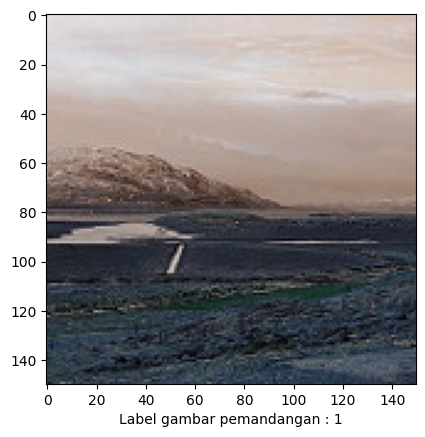

Hasil prediksi model: 1


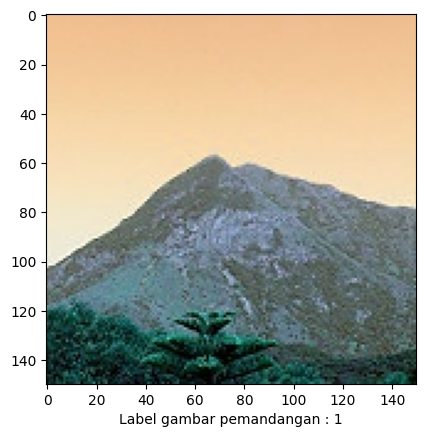

Hasil prediksi model: 1


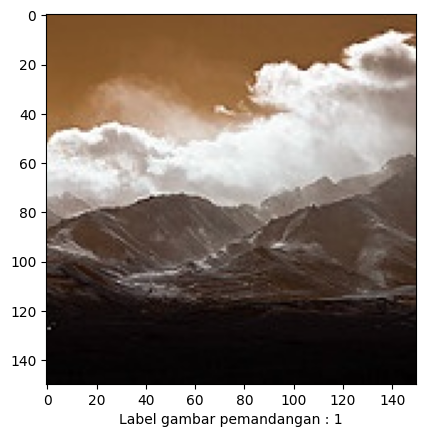

Hasil prediksi model: 1


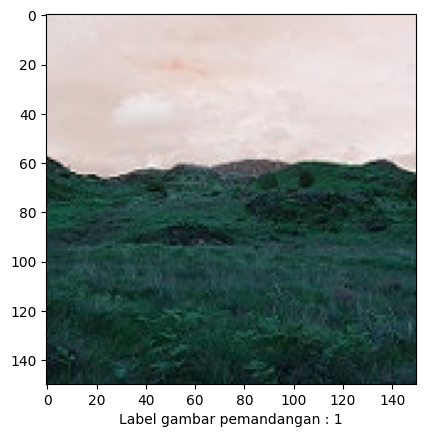

Hasil prediksi model: 1


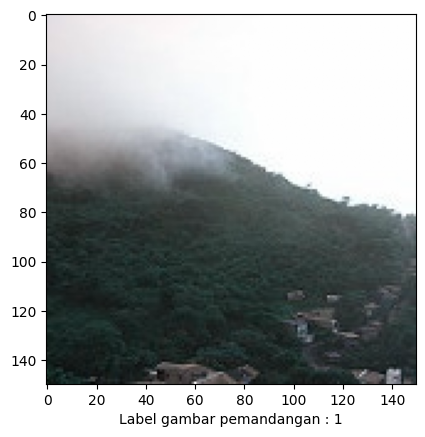

Hasil prediksi model: 1


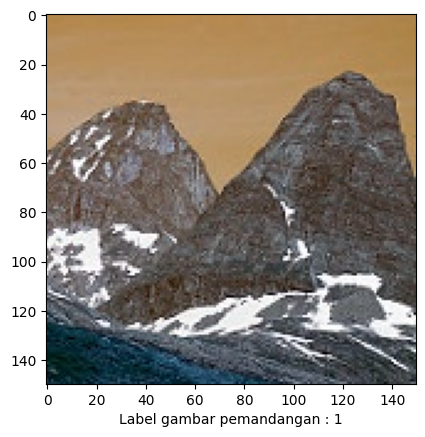

Hasil prediksi model: 3


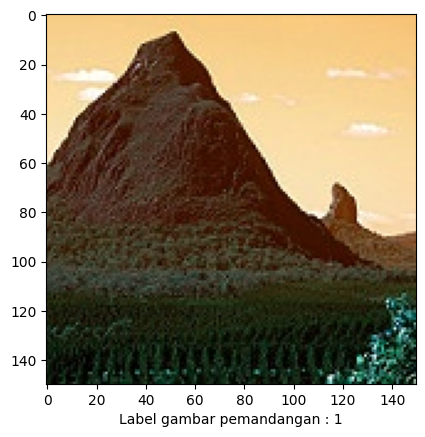

Hasil prediksi model: 1


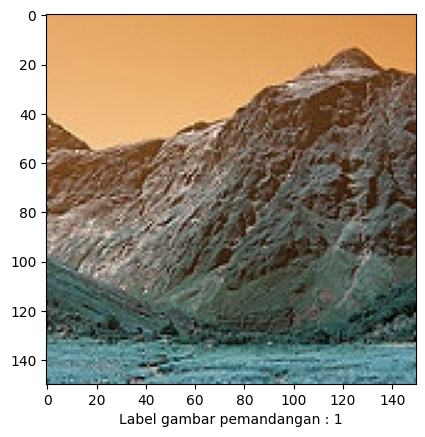

Hasil prediksi model: 1


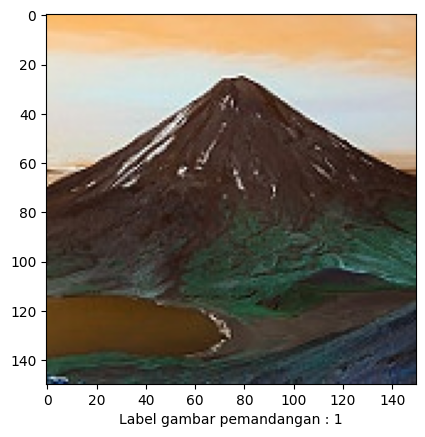

Hasil prediksi model: 1


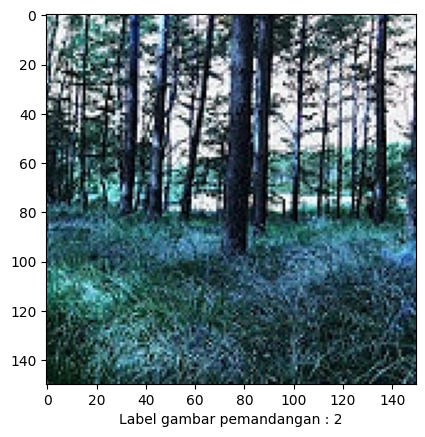

Hasil prediksi model: 2


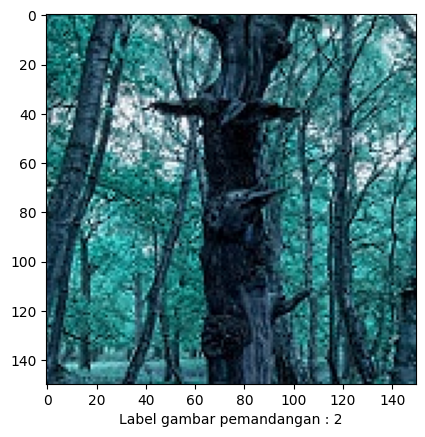

Hasil prediksi model: 2


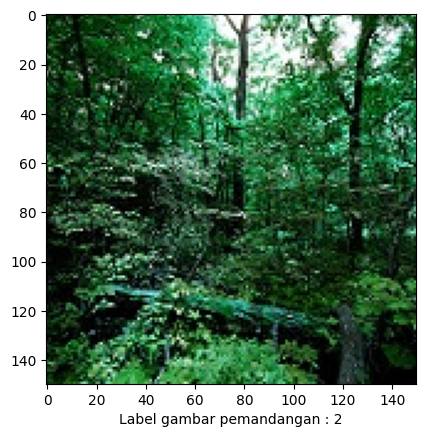

Hasil prediksi model: 2


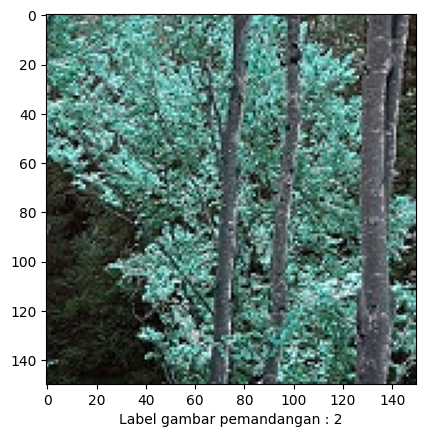

Hasil prediksi model: 2


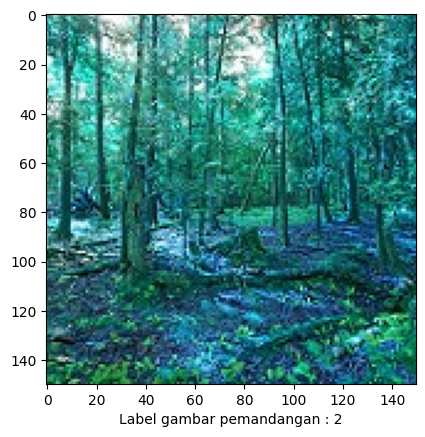

Hasil prediksi model: 2


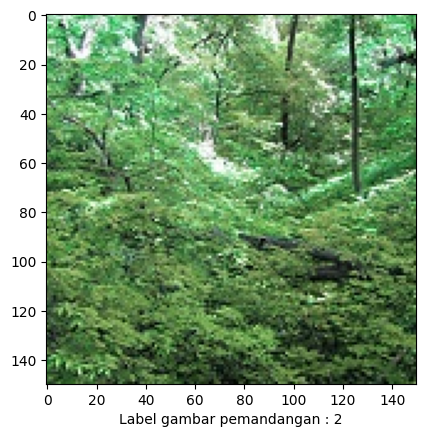

Hasil prediksi model: 2


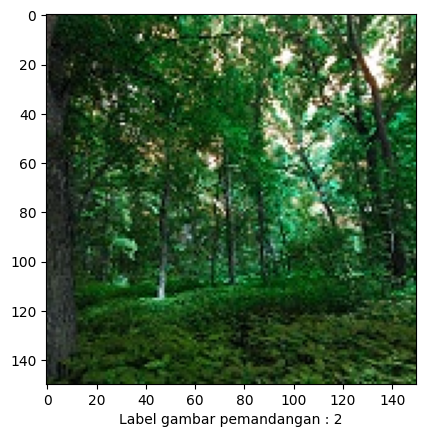

Hasil prediksi model: 2


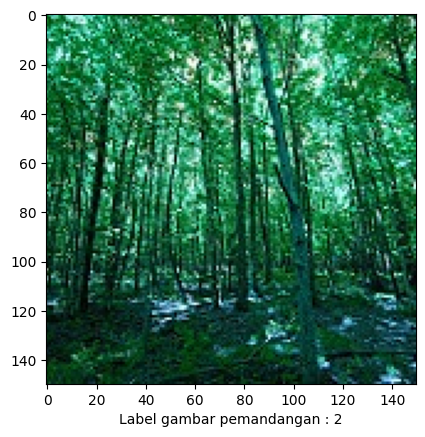

Hasil prediksi model: 2


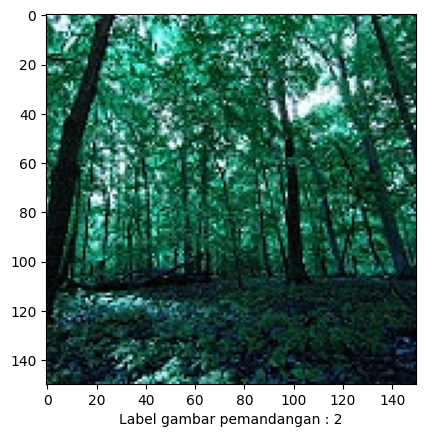

Hasil prediksi model: 2


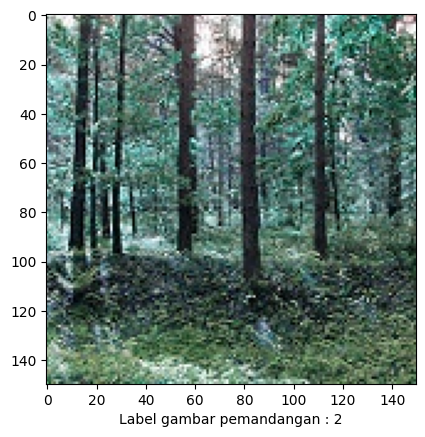

Hasil prediksi model: 2


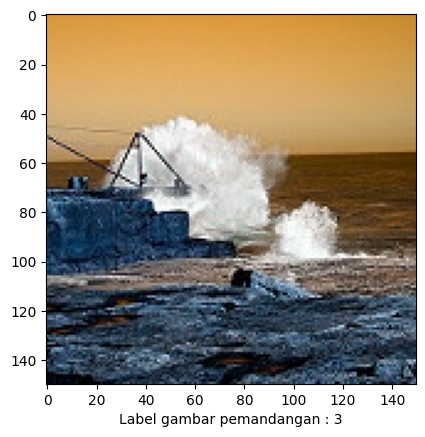

Hasil prediksi model: 3


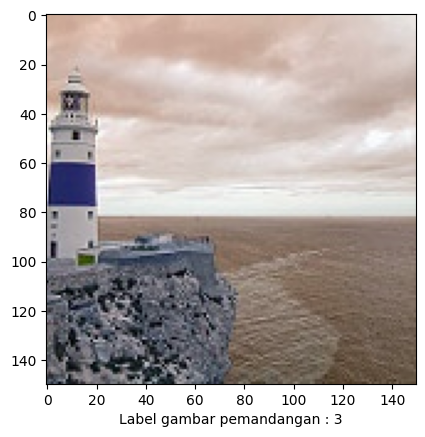

Hasil prediksi model: 1


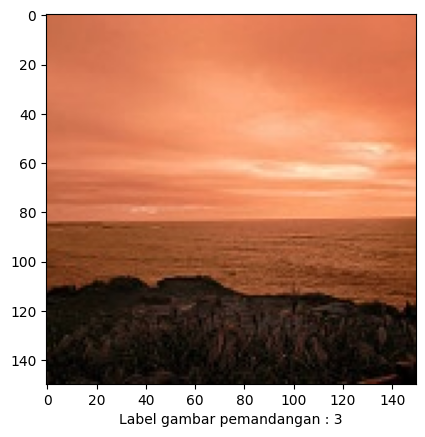

Hasil prediksi model: 1


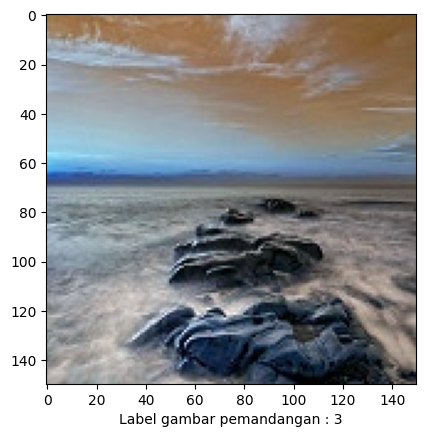

Hasil prediksi model: 3


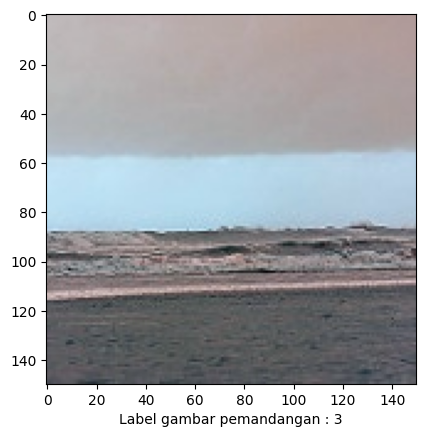

Hasil prediksi model: 3


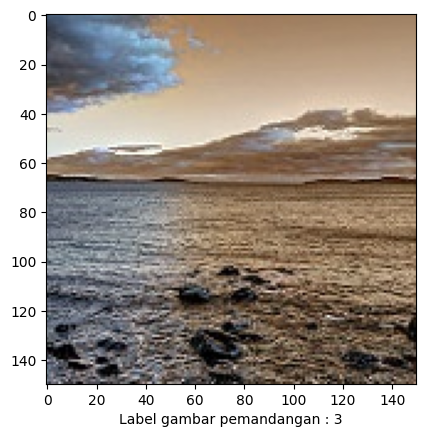

Hasil prediksi model: 3


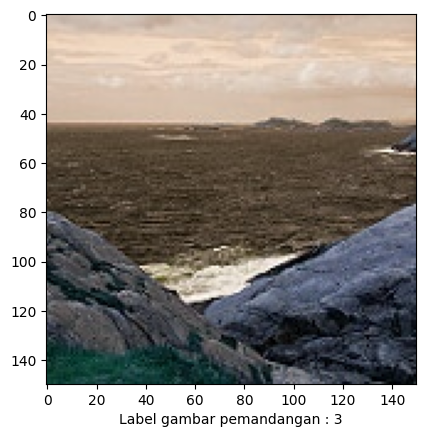

Hasil prediksi model: 3


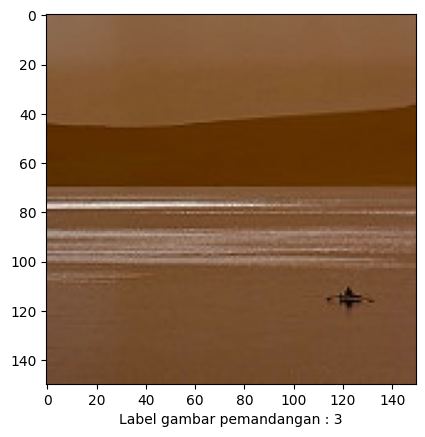

Hasil prediksi model: 3


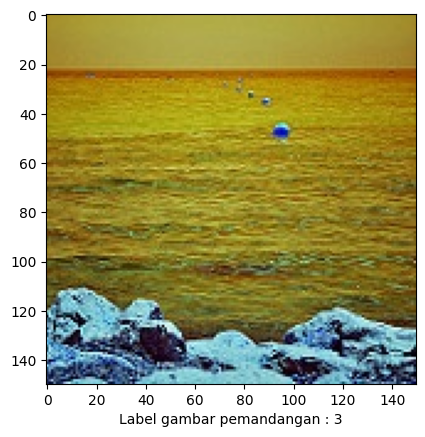

Hasil prediksi model: 3


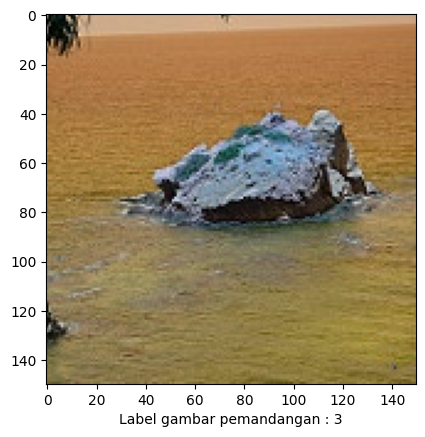

Hasil prediksi model: 3


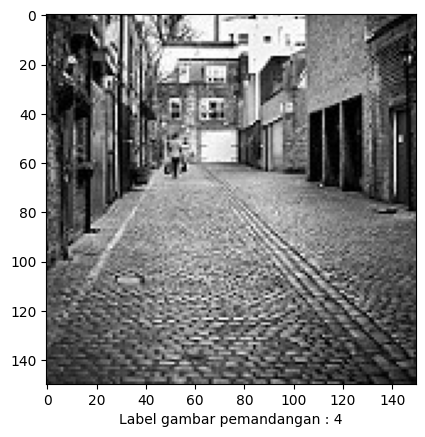

Hasil prediksi model: 4


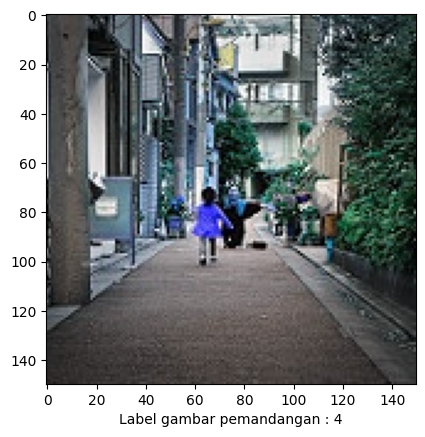

Hasil prediksi model: 4


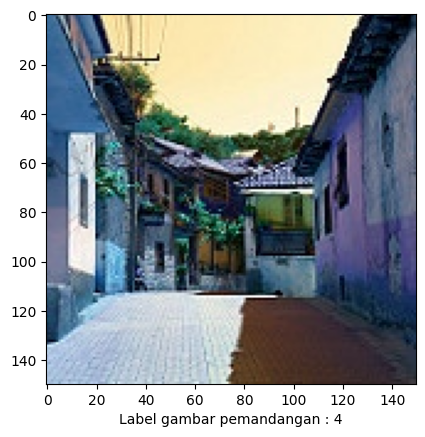

Hasil prediksi model: 4


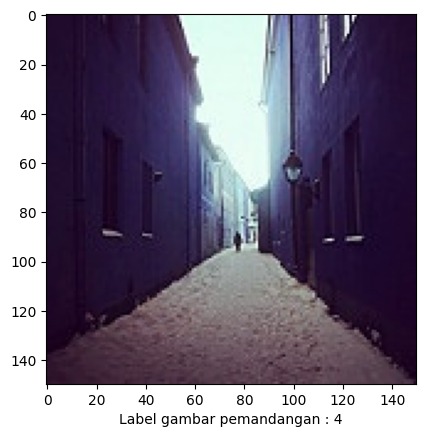

Hasil prediksi model: 4


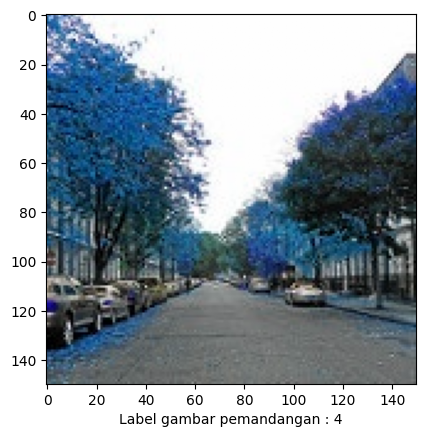

Hasil prediksi model: 1


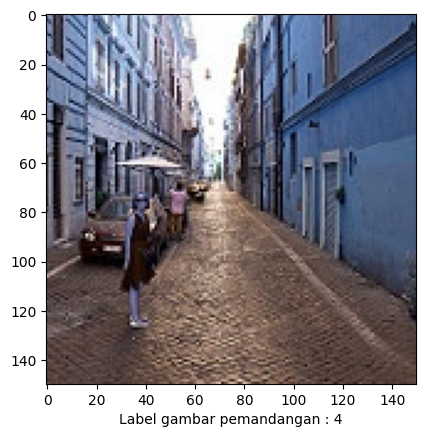

Hasil prediksi model: 4


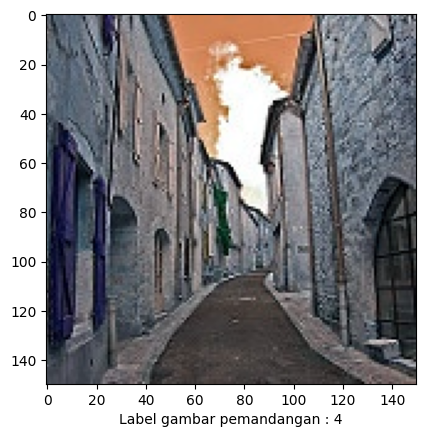

Hasil prediksi model: 4


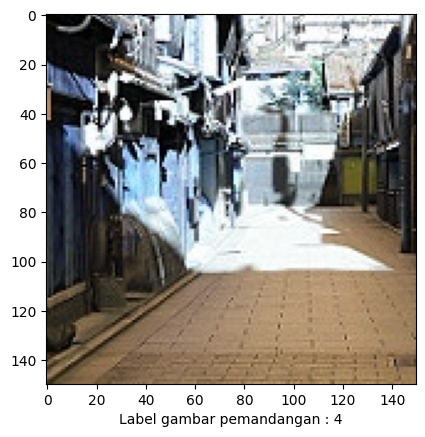

Hasil prediksi model: 4


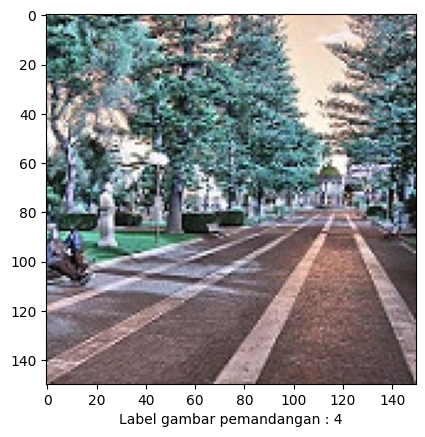

Hasil prediksi model: 4


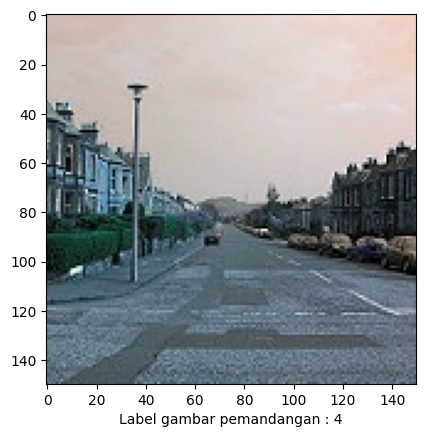

Hasil prediksi model: 3


In [34]:
# Visualisasikan hasil prediksi pengenalan gambar pemandangan.

import matplotlib.pyplot as plt

# Memprediksi 50 gambar dari Data Uji.
n_images = 50
test_images = X_uji[:n_images]
test_label = y_uji[:n_images]

predictions = model.predict(test_images)

# Menampilkan gambar dan prediksi model.
for i in range(n_images):
    plt.imshow(test_images[i])
    plt.xlabel("Label gambar pemandangan : %i" % test_label[i])
    plt.show()
    print("Hasil prediksi model: %i" % np.argmax(predictions[i]))


In [35]:
(80+90+100+80+80)/5

86.0